In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import requests
from ast import literal_eval

In [2]:
def fetch_turbine_data_from_oedb(schema="supply", table="wind_turbine_library"):
    r"""
    Fetches turbine library from the OpenEnergy database (oedb).
    Parameters
    ----------
    schema : str
        Database schema of the turbine library.
    table : str
        Table name of the turbine library.
    Returns
    -------
    :pandas:`pandas.DataFrame<frame>`
        Turbine data of different turbines such as 'manufacturer',
        'turbine_type', 'nominal_power'.
    """
    # url of OpenEnergy Platform that contains the oedb
    oep_url = "http://oep.iks.cs.ovgu.de/"
    url = oep_url + "/api/v0/schema/{}/tables/{}/rows/?".format(schema, table)

    # load data
    result = requests.get(url)
    if not result.status_code == 200:
        raise ConnectionError(
            "Database (oep) connection not successful. \nURL: {2}\n"
            "Response: [{0}] \n{1}".format(
                result.status_code, result.text, url
            )
        )
    return pd.DataFrame(result.json())

In [3]:
def save_figure(plot, title, in_parent_dir=True):
    plots_folder = "Plots"
    if in_parent_dir:
        parent_dir = os.path.dirname(os.getcwd())
        if not os.path.exists(f'{parent_dir}/{plots_folder}'):
            os.makedirs(f'{parent_dir}/{plots_folder}')
        plot.savefig(f'{parent_dir}/{plots_folder}/{title}.png')
    else:
        if not os.path.exists(f'{plots_folder}'):
            os.makedirs(f'{plots_folder}')
        plot.savefig(f'{plots_folder}/{title}.png')

In [4]:
def construct_power_curve_entire_data(data):
    exp = data['LV ActivePower (kW)']
    the = data['Theoretical_Power_Curve (KWh)']
    plt.figure(figsize=(11,6)) 
    plt.plot(data['Wind Speed (m/s)'], data['LV ActivePower (kW)'], 'o', label='Actual Power')
    plt.plot(data['Wind Speed (m/s)'], data['Theoretical_Power_Curve (KWh)'], '.',                                                                          label='Calculated power (kwh)')
    plt.xlabel('wind speed (m/s)', size=10, labelpad=20)
    plt.ylabel('Net Power (kw)', size=10, labelpad=20)
    plt.title('Wind Turbine Power Curve')
    plt.legend(fontsize=15)
    plt.show()

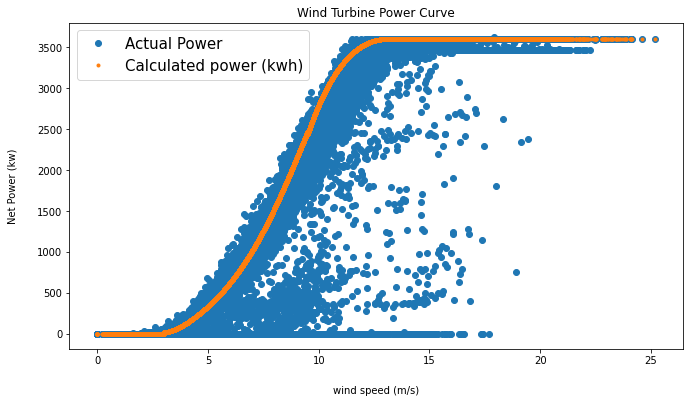

In [31]:
data = pd.read_csv('../Dataset/T1.csv')
construct_power_curve_entire_data(data)

In [5]:
df = fetch_turbine_data_from_oedb()
power_curve_wind_speeds = literal_eval(df.iloc[0].to_dict()['power_curve_wind_speeds'])
power_curve_values = literal_eval(df.iloc[0].to_dict()['power_curve_values'])

In [6]:
def plot_power_curve(xs, ys):
    plt.plot(xs, ys, linestyle='--', marker='o', color='b')

    plt.vlines(3, 0, 4300, linestyles='--', alpha=0.5, color='b' )
    plt.text(3.5, 1800, 'Cut-in speed', rotation=90)

    plt.vlines(12.5, 0, 4300, linestyles='--', alpha=0.5, color='b')
    plt.text(13, 1800, 'Rated power', rotation=90)

    plt.vlines(25, 0, 4300, linestyles='--', alpha=0.5, color='b')
    plt.text(25.5, 1800, 'Cut-out speed', rotation=90)

    plt.title(f"Turbine Power Curve")
    plt.xlabel('Speed (m/s)')
    plt.ylabel('Power (kW)')
    plt.tight_layout()
    plt.grid()

    save_figure(plt, 'Turbine Power Curve')

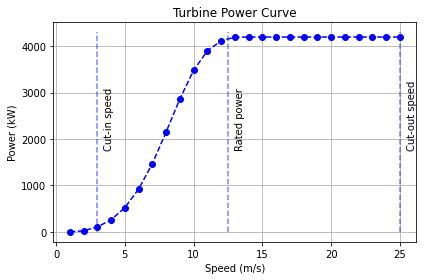

In [7]:
plot_power_curve(power_curve_wind_speeds, power_curve_values)

In [8]:
df.columns

Index(['id', 'turbine_id', 'manufacturer', 'name', 'turbine_type',
       'nominal_power', 'rotor_diameter', 'rotor_area', 'hub_height',
       'max_speed_drive', 'wind_class_iec', 'wind_zone_dibt', 'power_density',
       'power_density_2', 'calculated', 'has_power_curve',
       'power_curve_wind_speeds', 'power_curve_values', 'has_cp_curve',
       'power_coefficient_curve_wind_speeds', 'power_coefficient_curve_values',
       'has_ct_curve', 'thrust_coefficient_curve_wind_speeds',
       'thrust_coefficient_curve_values', 'source'],
      dtype='object')

In [10]:
df

,id,turbine_id,manufacturer,name,turbine_type,nominal_power,rotor_diameter,rotor_area,hub_height,max_speed_drive,...,has_power_curve,power_curve_wind_speeds,power_curve_values,has_cp_curve,power_coefficient_curve_wind_speeds,power_coefficient_curve_values,has_ct_curve,thrust_coefficient_curve_wind_speeds,thrust_coefficient_curve_values,source
0,0,1,Enercon,E-141/4200 EP 4,E-141/4200,4200,141,15613,99; 129; 135; 159,11,...,True,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...","[0.0, 22.0, 104.0, 260.0, 523.0, 920.0, 1471.0...",True,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...","[0.0, 0.29, 0.4, 0.42, 0.44, 0.45, 0.45, 0.44,...",False,None,None,https://www.enercon.de/fileadmin/Redakteur/Med...
1,1,2,Enercon,E-126/4200 EP4,E-126/4200,4200,127,12666,99; 135; 159,11.6,...,True,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...","[0.0, 0.0, 58.0, 185.0, 400.0, 745.0, 1200.0, ...",True,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...","[0.0, 0.0, 0.28, 0.37, 0.41, 0.44, 0.45, 0.45,...",False,None,None,https://www.enercon.de/fileadmin/Redakteur/Med...
2,2,3,Enercon,E-101/3500 E2,E-101/3500,3500,101,8011,74; 99,14.5,...,True,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...","[0.0, 3.0, 37.0, 116.0, 253.0, 469.0, 775.0, 1...",True,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...","[0.0, 0.08, 0.28, 0.37, 0.41, 0.44, 0.46, 0.47...",False,None,None,https://www.enercon.de/fileadmin/Redakteur/Med...
3,3,4,Enercon,E-115/3200,E-115/3200,3200,116,10512,92; 122; 135; 149,12.8,...,True,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...","[0.0, 3.0, 49.0, 155.0, 339.0, 628.0, 1036.0, ...",True,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...","[0.0, 0.06, 0.28, 0.38, 0.42, 0.45, 0.47, 0.46...",False,None,None,https://www.enercon.de/fileadmin/Redakteur/Med...
4,4,5,Enercon,E-101/3050 E2,E-101/3050,3050,101,8011,99; 124; 135; 149,14.5,...,True,"[0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, ...","[0.0, 0.0, 0.0, 0.0, 3.0, 22.0, 49.0, 92.0, 15...",True,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...","[0.0, 0.076, 0.279, 0.376, 0.421, 0.452, 0.469...",False,None,None,https://www.enercon.de/fileadmin/Redakteur/Med...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,135,147,Vestas,V100/1800 GS,V100/1800/GS,1800,100,7853,None,None,...,True,"[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ...","[12.0, 40.0, 93.0, 161.0, 241.0, 336.0, 446.0,...",True,"[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ...","[0.092, 0.194, 0.302, 0.367, 0.401, 0.42, 0.42...",True,"[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ...","[0.87, 0.891, 0.882, 0.854, 0.825, 0.807, 0.80...",http://www.windenergie-im-binnenland.de/powerc...
136,136,148,Vestas,V117-3.6,V117/3600,3600,117,10750,None,None,...,True,"[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ...","[22.0, 78.0, 150.0, 237.0, 340.0, 466.0, 617.0...",True,"[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ...","[0.124, 0.276, 0.356, 0.395, 0.413, 0.425, 0.4...",True,"[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, ...","[0.873, 0.849, 0.835, 0.828, 0.827, 0.825, 0.8...",http://www.windenergie-im-binnenland.de/powerc...
137,137,149,aerodyn,SCD 168 8000,SCD168/8000,8000,168,22164,None,None,...,True,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...","[0.0, 0.0, 0.0, 100.0, 500.0, 1000.0, 2000.0, ...",False,None,None,False,None,None,https://www.wind-turbine-models.com/turbines/1...
138,138,150,Enercon,E-126/7500,E-126/7500,7500,127,12666,125,None,...,True,"[0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 25.0, 55.0, 110.0, 1...",False,None,None,False,None,None,https://www.thewindpower.net/turbine_en_225_en...


In [11]:
datum = pd.read_csv('../dataset/open_data.csv', sep=";").reset_index()

In [13]:
datum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 217588 entries, 0 to 217587
Columns: 139 entries, index to Na_c_std
dtypes: float64(136), int64(1), object(2)
memory usage: 230.7+ MB


In [17]:
datum.head()

,index,Wind_turbine_name,Date_time,Ba_avg,Ba_min,Ba_max,Ba_std,Rt_avg,Rt_min,Rt_max,...,Pas_max,Pas_std,Wa_c_avg,Wa_c_min,Wa_c_max,Wa_c_std,Na_c_avg,Na_c_min,Na_c_max,Na_c_std
0,0,R80721,2017-02-08T08:00:00+01:00,44.990002,44.990002,44.990002,0.0,14.0,14.0,14.0,...,NaN,NaN,358.04999,NaN,NaN,NaN,358.04999,NaN,NaN,NaN
1,1,R80721,2017-01-26T02:40:00+01:00,-1.000000,-1.000000,-1.000000,0.0,10.0,10.0,10.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,R80721,2017-01-26T13:50:00+01:00,-1.000000,-1.000000,-1.000000,0.0,10.0,10.0,10.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,R80721,2017-01-26T15:00:00+01:00,-1.000000,-1.000000,-1.000000,0.0,10.0,10.0,10.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,R80721,2017-02-18T01:10:00+01:00,44.990002,44.990002,44.990002,0.0,17.0,17.0,17.0,...,NaN,NaN,7.99000,NaN,NaN,NaN,7.99000,NaN,NaN,NaN
